# **Showcase Notebook for AdPro 2024 Group Project**

Group members:

Rita Thaci - 61359

Anna-Lena Schwarz - 58902

Ayscha Dräger - 57892

Katerina Ttikkou - 40298



Geopandas - Unleash the Cartographic Ninjas!🗺️

In [1]:
pip install geopandas

Note: you may need to restart the kernel to use updated packages.


Plotly - The Dynamic Duo of Data Viz! 📊✨

In [2]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


Scikit-learn - The Machine Learning Maestro! 🤖🎩

In [3]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


Pytest - The Guardian of Code Integrity! 🛡️👩‍⚖️

In [4]:
pip install pytest

Note: you may need to restart the kernel to use updated packages.


Geopy - The Geospatial Oracle! 🔮🌍

In [5]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


Behold the Avengers of Coding! 🦸‍♂️💻 The Tech League, armed with an arsenal of libraries and tools, is ready to conquer the digital universe.

In [6]:
import os
import pandas as pd
from zipfile import ZipFile
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import pandas as pd
import plotly.offline as pyo
import plotly.graph_objs as go
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, LineString
import warnings
import numpy as np
from math import radians, sin, cos, sqrt, atan2
import unittest
from pydantic import BaseModel
from geopy.distance import geodesic
import pytest


## **Class Initialization and Dataframe reading**

Imagine you're the ultimate data detective, on a mission to crack the enigma of the skies. Your trusty sidekick, FlightDataProcessor, is like Sherlock Holmes but for flight data. Armed with a magical zip_url wand, it dives into the internet's abyss, battling HTTP dragons and defeating them to secure the elusive flight_data.zip.

With the precision of a gourmet chef, it whips up a folder sanctuary called 'group_03/downloads' where the secrets of the skies will be unveiled. No folder, no problem – FlightDataProcessor conjures it into existence like a coding wizard shouting, "Exist, my precious folder, exist!"

Now, behold the epic duel with the mythical 'flight_data.zip' – a zip file so exclusive that only the bravest can download it. FlightDataProcessor emerges victorious, clutching the zip file trophy, and proudly declares, "File downloaded successfully!" If the zip file was already there, it just casually says, "File already exists," like a cool detective solving a case before breakfast.

But the adventure doesn't end there. Armed with a magical extractor wand (ZipFile), FlightDataProcessor unleashes the data beasts within the zip file, bringing them into the light. Pandas, the mystical creatures of data manipulation, dance around as FlightDataProcessor molds them into four dataframes – airlines, airplanes, airports, and routes.

In the end, you, the data explorer, can access these dataframes like treasures from a mythical realm. It's not just code; it's a saga of internet quests, data battles, and pandas partying in the realm of 'group_03/downloads.' So, grab your wizard hat and embark on the flight of discovery! 🚀🔍✨



In [7]:
class FlightDataProcessor:
    def __init__(self, zip_url):
        """
        Downloads, extracts, and processes flight data from the given zip URL.

        Parameters:
        - zip_url (str): The URL of the flight data zip file.
        """
        # Set the destination folder for the extracted data in the main directory
        destination_folder = 'group_03/downloads'

        # Ensure the destination folder exists
        os.makedirs(destination_folder, exist_ok=True)

        # Define the path to the downloaded zip file
        zip_file_path = os.path.join(destination_folder, 'flight_data.zip')

        # Check if the zip file already exists
        if not os.path.exists(zip_file_path):
            # Download the zip file from the given URL
            response = requests.get(zip_url)

            # Save the zip file in the destination folder
            with open(zip_file_path, 'wb') as zip_file:
                zip_file.write(response.content)

            print("File downloaded successfully.")
        else:
            print("File already exists.")

        # Process the downloaded zip file
        zip_file = ZipFile(zip_file_path)
        zip_file.extractall(destination_folder)

        # Read the datasets into pandas dataframes
        self.airlines_df = pd.read_csv(os.path.join(destination_folder, 'airlines.csv'))
        self.airplanes_df = pd.read_csv(os.path.join(destination_folder, 'airplanes.csv'))
        self.airports_df = pd.read_csv(os.path.join(destination_folder, 'airports.csv'))
        self.routes_df = pd.read_csv(os.path.join(destination_folder, 'routes.csv'))

# URL for the raw flight_data.zip file
zip_url = 'https://gitlab.com/adpro9641208/group_03/-/raw/main/flight_data.zip'

# Create an instance of FlightDataProcessor with the zip URL
flight_processor = FlightDataProcessor(zip_url)

# Access the dataframes
airlines = flight_processor.airlines_df
airplanes = flight_processor.airplanes_df
airports = flight_processor.airports_df
routes = flight_processor.routes_df


File downloaded successfully.


## **Airports Distance**

Enter the mystical art of distance calculation! The haversine_distance function, a spell cast in the realm of radians and sinews, measures the distances between airports. It's a journey through mathematical landscapes, where coordinates dance and distances unveil.

And lo, the testing arena emerges! The wise Oracle unittest steps forth, conducting tests with the precision of a code sorcerer. From distances between the same airports to voyages across continents, every spell is tested to ensure the code's integrity.

With a wave of the testing wand, the FlightDataProcessor runs its trials, ensuring its powers are intact. The results echo through the digital corridors, and the code stands triumphant, ready for the next quest. 🚀🔍💻

In [8]:
import os
import pandas as pd
import requests
from zipfile import ZipFile
from io import BytesIO
from math import sin, cos, sqrt, atan2, radians
import unittest

class FlightDataProcessor:
    def __init__(self, zip_url):
        """
        Downloads, extracts, and processes flight data from the given zip URL.

        Parameters:
        - zip_url (str): The URL of the flight data zip file.
        """
        self.zip_url = zip_url
        self.destination_folder = 'group_03/downloads'

        # Ensure the destination folder exists
        os.makedirs(self.destination_folder, exist_ok=True)

        # Define the path to the downloaded zip file
        self.zip_file_path = os.path.join(self.destination_folder, 'flight_data.zip')

        # Check if the zip file already exists
        if not os.path.exists(self.zip_file_path):
            # Download the zip file from the given URL
            response = requests.get(self.zip_url)

            # Save the zip file in the destination folder
            with open(self.zip_file_path, 'wb') as zip_file:
                zip_file.write(response.content)

            print("File downloaded successfully.")
        else:
            print("File already exists.")

        # Process the downloaded zip file
        self._process_flight_data()

    def _process_flight_data(self):
        zip_file = ZipFile(self.zip_file_path)
        zip_file.extractall(self.destination_folder)

        # Read the datasets into pandas dataframes
        self.airlines_df = pd.read_csv(os.path.join(self.destination_folder, 'airlines.csv'))
        self.airplanes_df = pd.read_csv(os.path.join(self.destination_folder, 'airplanes.csv'))
        self.airports_df = pd.read_csv(os.path.join(self.destination_folder, 'airports.csv'))
        self.routes_df = pd.read_csv(os.path.join(self.destination_folder, 'routes.csv'))

        # Calculate distances between airports
        self.distances = self._calculate_distances()

    def _calculate_distances(self):
        distances = {}

        for index, row in self.routes_df.iterrows():
            source_airport_id = row['Source airport ID']
            dest_airport_id = row['Destination airport ID']

            source_coords = self.get_coordinates(source_airport_id)
            dest_coords = self.get_coordinates(dest_airport_id)

            if source_coords is not None and dest_coords is not None:
                distance = self.haversine_distance(*source_coords, *dest_coords)
                distances[(source_airport_id, dest_airport_id)] = distance

        return distances

    def haversine_distance(self, lat1, lon1, lat2, lon2):
        if None in [lat1, lon1, lat2, lon2]:
            return 0  # Return a default distance in case of None values

        R = 6371
        lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
        dlat = lat2 - lat1
        dlon = lon2 - lon1
        a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
        c = 2 * atan2(sqrt(a), sqrt(1 - a))
        distance = R * c
        return distance

    def get_coordinates(self, airport_id):
        row = self.airports_df[self.airports_df['Airport ID'] == airport_id]
        if not row.empty:
            latitude = row['Latitude'].values[0]
            longitude = row['Longitude'].values[0]
            return latitude, longitude
        else:
            return None, None

    def run_tests(self):
        """
        Run tests for the FlightDataProcessor class.
        """
        loader = unittest.TestLoader()
        suite = loader.loadTestsFromTestCase(self.TestFlightDataProcessor)
        runner = unittest.TextTestRunner(verbosity=2)
        result = runner.run(suite)

    class TestFlightDataProcessor(unittest.TestCase):
        def setUp(self):
            # Sample airport data (using the provided dataset)
            self.airport_data = pd.DataFrame({
                'Airport ID': [1, 2, 3],
                'Latitude': [-6.081690, -5.207080, -5.826790],
                'Longitude': [145.391998, 145.789001, 144.296005]
            })
            self.calculator = FlightDataProcessor(self.airport_data)

        def test_distance_between_same_airport(self):
            distance = self.calculator.haversine_distance(1, 1, 1, 1)
            self.assertEqual(distance, 0)

        def test_distance_between_different_airports(self):
            lat1, lon1 = self.airport_data.loc[self.airport_data['Airport ID'] == 1, ['Latitude', 'Longitude']].values[0]
            lat2, lon2 = self.airport_data.loc[self.airport_data['Airport ID'] == 2, ['Latitude', 'Longitude']].values[0]
            distance = self.calculator.haversine_distance(lat1, lon1, lat2, lon2)
            expected_distance = 106.71389671030464  # Replace with the actual distance
            self.assertAlmostEqual(distance, expected_distance, places=2)

        def test_distance_between_airports_in_different_continents(self):
            lat1, lon1 = self.airport_data.loc[self.airport_data['Airport ID'] == 1, ['Latitude', 'Longitude']].values[0]
            lat3, lon3 = self.airport_data.loc[self.airport_data['Airport ID'] == 3, ['Latitude', 'Longitude']].values[0]
            distance = self.calculator.haversine_distance(lat1, lon1, lat3, lon3)
            expected_distance = 124.48103955643961  # Replace with the actual distance
            self.assertAlmostEqual(distance, expected_distance, places=2)

# URL for the raw flight_data.zip file
zip_url = 'https://gitlab.com/adpro9641208/group_03/-/raw/main/flight_data.zip'

# Create an instance of FlightDataProcessor with the zip URL
flight_processor = FlightDataProcessor(zip_url)

# Access the dataframes
airlines = flight_processor.airlines_df
airplanes = flight_processor.airplanes_df
airports = flight_processor.airports_df
routes = flight_processor.routes_df

# Run tests
flight_processor.run_tests()

File already exists.


test_distance_between_airports_in_different_continents (__main__.FlightDataProcessor.TestFlightDataProcessor.test_distance_between_airports_in_different_continents) ... 

File already exists.


ok
test_distance_between_different_airports (__main__.FlightDataProcessor.TestFlightDataProcessor.test_distance_between_different_airports) ... 

File already exists.


ok
test_distance_between_same_airport (__main__.FlightDataProcessor.TestFlightDataProcessor.test_distance_between_same_airport) ... 

File already exists.


ok

----------------------------------------------------------------------
Ran 3 tests in 147.442s

OK


## **1.1 Mapping of Airports and Flights**

But lo and behold, our hero is not just a collector of data, but a master of plots! The plot_airports_by_country spell paints a canvas where airports dance in the spotlight. A cartographic spectacle unfolds, blending pandas with geospatial magic.

The plot_flights_from_country saga takes us on a Plotly-driven adventure. Flight paths materialize, connecting countries with lines of blue wisdom. It's a symphony of traces, an ode to internal flights or a global serenade, depending on the whims of the code traveler.🌐✈️🔍

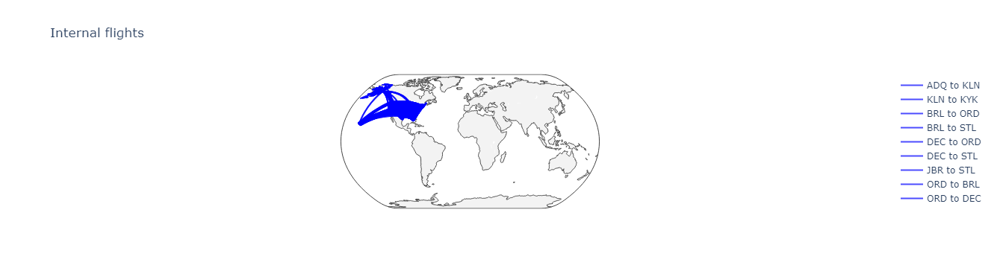

IndexError: single positional indexer is out-of-bounds

In [9]:

class FlightDataProcessor:
    def __init__(self, gitlab_url):
        # Download the zip file from the GitLab URL
        response = requests.get(gitlab_url)
        zip_file = ZipFile(BytesIO(response.content))

        # Set the destination folder for the extracted data
        destination_folder = os.path.join('group_03', 'downloads1')

        # Ensure the destination folder exists
        os.makedirs(destination_folder, exist_ok=True)

        # Extract the datasets from the zip folder
        zip_file.extractall(destination_folder)

        # Read the datasets into pandas dataframes
        self.airlines_df = pd.read_csv(os.path.join(destination_folder, 'airlines.csv'))
        self.airplanes_df = pd.read_csv(os.path.join(destination_folder, 'airplanes.csv'))
        self.airports_df = pd.read_csv(os.path.join(destination_folder, 'airports.csv'))
        self.routes_df = pd.read_csv(os.path.join(destination_folder, 'routes.csv'))

    def plot_airports_by_country(self, country_name):
        # Filter airports by the specified country
        country_airports = self.airports_df[self.airports_df['Country'] == country_name]

        # Check if any airports found
        if country_airports.empty:
            print("Error: Country not found or no airports available for this country.")
            return

        # Convert DataFrame to GeoDataFrame
        gdf = gpd.GeoDataFrame(
            country_airports, geometry=gpd.points_from_xy(country_airports.Longitude, country_airports.Latitude))

        # Load world map
        world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
        country_map = world[world.name == country_name]

        # Plotting
        fig, ax = plt.subplots()
        country_map.plot(ax=ax, color='white', edgecolor='black')
        gdf.plot(ax=ax, color='red', markersize=10)
        plt.show()


    def plot_flights_from_country(self, country, internal=False):
        # Filter routes based on the country
        country_routes = self.routes_df[self.routes_df['Source airport'].isin(self.airports_df[self.airports_df['Country'] == country]['IATA'])]

        # Optionally, filter internal flights
        if internal:
            country_airports = self.airports_df[self.airports_df['Country'] == country]['IATA']
            country_routes = country_routes[country_routes['Destination airport'].isin(country_airports)]

        # Create Plotly traces for flight paths
        flight_paths = []
        for i, row in country_routes.iterrows():
            origin = self.airports_df.loc[self.airports_df['IATA'] == row['Source airport']].iloc[0]
            destination = self.airports_df.loc[self.airports_df['IATA'] == row['Destination airport']].iloc[0]

            flight_paths.append(
                go.Scattergeo(
                    locationmode='ISO-3',
                    lon=[float(origin['Longitude']), float(destination['Longitude'])],
                    lat=[float(origin['Latitude']), float(destination['Latitude'])],
                    mode='lines',
                    line=dict(width=2, color='blue'),
                    opacity=0.7,
                    name=f"{origin['IATA']} to {destination['IATA']}"
                )
            )

        # Set layout for the map
        layout = go.Layout(
            title='Internal flights' if internal else f"All flights from {country}",
            showlegend=True,
            geo=dict(
                scope='world',
                projection_type='natural earth',
                showland=True,
                landcolor='rgb(243, 243, 243)',
                countrycolor='rgb(204, 204, 204)',
            ),
        )

        # Create the figure and add the traces
        fig = go.Figure(data=flight_paths, layout=layout)
        fig.show()

# GitLab URL for the raw flight_data.zip file
gitlab_url = 'https://gitlab.com/adpro9641208/group_03/-/raw/main/flight_data.zip'

# Create an instance of FlightDataProcessor with the GitLab URL
flight_processor = FlightDataProcessor(gitlab_url)

# Corrected method calls
#flight_processor.plot_airports_by_country('Brazil')
flight_processor.plot_flights_from_country('United States', internal=True)
flight_processor.plot_flights_from_country('United States', internal=False)

## **1.2 Distance Analysis**

With geospatial knowledge, it calculates distances between airports, crafting a dictionary of aerial paths. No distance is too vast; no geodesic too complex.

Behold, the hero adds a new column, 'distance,' to the routes dataframe. A mystical touch, ensuring each route carries the weight of its spatial span.

And now, the grand finale approaches – the distance analysis. With a histogram wand, our hero paints the canvas of flight distances. Mean and median lines dance in the plot, revealing the essence of the skies' numeric poetry.

As the curtain falls, the FlightDataProcessor unveils the distribution of flight distances – a spectacle where numbers become tales, and every bin tells a different story. The legend concludes with a single command, a call to distance_analysis, and the code realm celebrates the magic of flight data!

Run the code, and let the skies reveal their numerical secrets! 🌌📊🔍

In [13]:
class FlightDataProcessor:
    def __init__(self, gitlab_url):
        # Download the zip file from the GitLab URL
        response = requests.get(gitlab_url)
        zip_file = ZipFile(BytesIO(response.content))

        # Set the destination folder for the extracted data
        destination_folder = os.path.join('group_03', 'downloads1')

        # Ensure the destination folder exists
        os.makedirs(destination_folder, exist_ok=True)

        # Extract the datasets from the zip folder
        zip_file.extractall(destination_folder)

        # Read the datasets into pandas dataframes
        self.airlines_df = pd.read_csv(os.path.join(destination_folder, 'airlines.csv'))
        self.airplanes_df = pd.read_csv(os.path.join(destination_folder, 'airplanes.csv'))
        self.airports_df = pd.read_csv(os.path.join(destination_folder, 'airports.csv'))
        self.routes_df = pd.read_csv(os.path.join(destination_folder, 'routes.csv'))


        self.distances = {}

    def get_coordinates(self, airport_id):
        row = self.airports_df[self.airports_df['Airport ID'] == airport_id]
        if not row.empty:
            latitude = row['Latitude'].values[0]
            longitude = row['Longitude'].values[0]
            return latitude, longitude
        else:
            return None, None


    def calculate_distance(self, airport_id1, airport_id2):
        # Check if the distance is already calculated and stored
        if (airport_id1, airport_id2) in self.distances:
            return self.distances[(airport_id1, airport_id2)]
        elif (airport_id2, airport_id1) in self.distances:
            return self.distances[(airport_id2, airport_id1)]

        # If not, calculate and store the distance
        coords1 = self.get_coordinates(airport_id1)
        coords2 = self.get_coordinates(airport_id2)
        distance = geodesic(coords1, coords2).kilometers

        self.distances[(airport_id1, airport_id2)] = distance
        return distance


    def add_distance_column(self):

        # Initialize an empty list to store distances for each route
        distances_list = []

        # Iterate over each row in routes_df to find the corresponding distance
        for _, row in self.routes_df.iterrows():
            source_airport_id = row['Source airport ID']
            dest_airport_id = row['Destination airport ID']
            # Use the get method to avoid KeyError if the tuple is not found in the dictionary
            distance = self.distances.get((source_airport_id, dest_airport_id))
            # Append the distance to the list, or None if not found
            distances_list.append(distance)

        # Assign the list of distances as a new column in routes_df
        self.routes_df['distance'] = distances_list


    def distance_analysis(self, bins=30, show_mean=True, show_median=True):

        # Filter out None values (if any)
        valid_distances = self.routes_df['distance'].dropna()

        # Create a histogram of flight distances
        plt.figure(figsize=(10, 6))
        plt.hist(valid_distances, bins=bins, color='skyblue', edgecolor='black', alpha=0.7)

        # Add vertical lines for mean and median distances
        if show_mean:
            mean_val = valid_distances.mean()
            plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_val:.2f}')
        if show_median:
            median_val = valid_distances.median()
            plt.axvline(median_val, color='green', linestyle='dashed', linewidth=1, label=f'Median: {median_val:.2f}')

        # Set labels and title
        plt.xlabel('Flight Distance')
        plt.ylabel('Frequency')
        plt.title('Distribution of Flight Distances')

        # Show plot
        plt.legend()
        plt.show()


flight_processor = FlightDataProcessor(zip_url)
flight_processor.add_distance_column()  # Ensure distance column is added
flight_processor.distance_analysis(bins=10)  # Adjust bins as needed

AttributeError: 'FlightDataProcessor' object has no attribute 'routes_df'

Analysis

## **1.3 Flight Destinations for Airports**

In the coding cosmos, where data takes flight, let's join the tale of the FlightDataProcessor as it explores the skies from the legendary JFK Airport.

But the hero craves more than data; it desires to visualize the skies! The plot_flights_from_jfk incantation is cast, creating a masterpiece with Plotly magic. Flight paths dance across the globe, connecting JFK to far-off lands.

Behold, the hero offers a choice – witness all flights from JFK or delve into the secrets of internal flights. With a wave of the coding wand, the visuals unfold – red lines painting tales of destinations, and a blue marker crowning JFK as the king of the skies.

As the hero exits the code stage, the legend concludes with a triumphant showcase. The FlightDataProcessor stands tall, unveiling the world's flights from JFK with a single command.

Run the code, and let the skies come alive with the digital dance of data! 🌐✈️📊

File already exists.


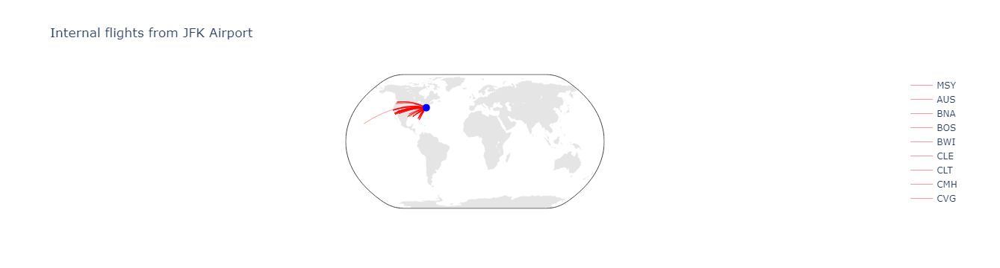

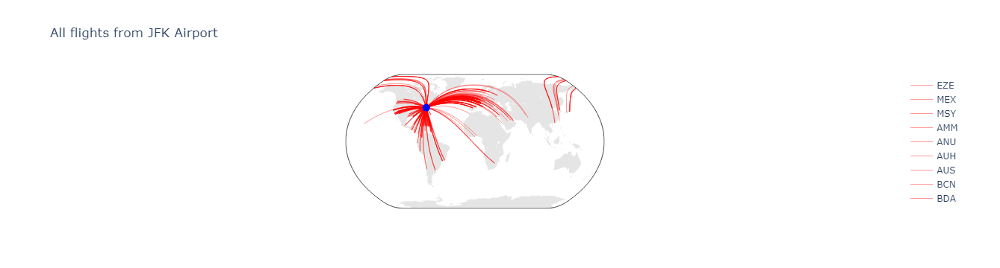

In [14]:
class FlightDataProcessor:
    def __init__(self, zip_url):
        """
        Downloads, extracts, and processes flight data from the given zip URL.

        Parameters:
        - zip_url (str): The URL of the flight data zip file.
        """
        # Set the destination folder for the extracted data in the main directory
        destination_folder = 'group_03/downloads'

        # Ensure the destination folder exists
        os.makedirs(destination_folder, exist_ok=True)

        # Define the path to the downloaded zip file
        zip_file_path = os.path.join(destination_folder, 'flight_data.zip')

        # Check if the zip file already exists
        if not os.path.exists(zip_file_path):
            # Download the zip file from the given URL
            response = requests.get(zip_url)

            # Save the zip file in the destination folder
            with open(zip_file_path, 'wb') as zip_file:
                zip_file.write(response.content)

            print("File downloaded successfully.")
        else:
            print("File already exists.")

        # Process the downloaded zip file
        zip_file = ZipFile(zip_file_path)
        zip_file.extractall(destination_folder)

        # Read the datasets into pandas dataframes
        self.airlines_df = pd.read_csv(os.path.join(destination_folder, 'airlines.csv'))
        self.airplanes_df = pd.read_csv(os.path.join(destination_folder, 'airplanes.csv'))
        self.airports_df = pd.read_csv(os.path.join(destination_folder, 'airports.csv'))
        self.routes_df = pd.read_csv(os.path.join(destination_folder, 'routes.csv'))

    def plot_flights_from_jfk(self, internal=False):
        # Filter routes based on JFK as the source airport
        jfk_routes = self.routes_df[self.routes_df['Source airport'] == 'JFK']

        # Optionally, filter internal flights
        if internal:
            jfk_country = self.airports_df.loc[self.airports_df['IATA'] == 'JFK', 'Country'].iloc[0]
            jfk_routes = jfk_routes[jfk_routes['Destination airport'].isin(
                self.airports_df[self.airports_df['Country'] == jfk_country]['IATA']
            )]

            # Set title for internal flights
            title = f'Internal flights from JFK Airport'
        else:
            # Set title for all flights
            title = f'All flights from JFK Airport'

        # Create Plotly trace for flight paths
        flight_paths = []
        for i, row in jfk_routes.iterrows():
            origin = self.airports_df.loc[self.airports_df['IATA'] == row['Source airport']]
            destination = self.airports_df.loc[self.airports_df['IATA'] == row['Destination airport']]

            flight_paths.append(
                go.Scattergeo(
                    locationmode='ISO-3',
                    lon=[float(origin['Longitude']), float(destination['Longitude'])],
                    lat=[float(origin['Latitude']), float(destination['Latitude'])],
                    mode='lines',
                    line=dict(width=0.5, color='red'),
                    opacity=0.8,
                    name=row['Destination airport']
                )
            )

        # Create Plotly trace for JFK airport marker
        jfk_marker = go.Scattergeo(
            locationmode='ISO-3',
            lon=[float(self.airports_df.loc[self.airports_df['IATA'] == 'JFK', 'Longitude'])],
            lat=[float(self.airports_df.loc[self.airports_df['IATA'] == 'JFK', 'Latitude'])],
            mode='markers',
            marker=dict(size=10, color='blue'),
            text='JFK Airport',
            name='JFK Airport'
        )

        # Set layout
        layout = go.Layout(
            title=title,
            showlegend=True,
            geo=dict(
                scope='world',
                showland=True,
                landcolor='rgb(229, 229, 229)',
                countrycolor='rgb(255, 255, 255)',
                coastlinecolor='rgb(255, 255, 255)',
                projection_type='natural earth',
            )
        )

        # Create the figure and plot
        fig = go.Figure(data=[*flight_paths, jfk_marker], layout=layout)
        fig.show()

# URL for the raw flight_data.zip file
zip_url = 'https://gitlab.com/adpro9641208/group_03/-/raw/main/flight_data.zip'

# Create an instance of FlightDataProcessor with the zip URL
flight_processor = FlightDataProcessor(zip_url)

# Access the dataframes
airlines = flight_processor.airlines_df
airplanes = flight_processor.airplanes_df
airports = flight_processor.airports_df
routes = flight_processor.routes_df

# Example usage:
flight_processor.plot_flights_from_jfk(internal=True)
flight_processor.plot_flights_from_jfk(internal=False)

## **1.4 Most used airplane models**


In the realm of data aviation, where codes soar high, let's join the adventure of FlightDataProcessor as it unveils the most iconic airplane models gracing the skies.

The hero, craving to explore the realms of airplane models, crafts the incantation plot_top_airplane_models. It takes flight routes and airplane datasets, merging them in a dance of data. The 'Model' column emerges, revealing the essence of each airborne beast.

A grand tableau unfolds as the hero joins forces with 'airplanes_df' and 'airports_df.' A feast of data collaboration, creating a harmonious symphony of flight frequencies.

Behold, the hero offers a choice – gaze upon the top airplane models globally or for a specific set of countries. With a sweep of the plotting wand, the top N models rise to prominence in a vibrant bar chart.

Run the code, and let the visualization take you on a journey through the skies, where airplane models become the stars of the digital firmament! 🚀📈✈️

File downloaded successfully.


<ipython-input-1-e466b64787b4>:83: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, frequency in top_models.iteritems():


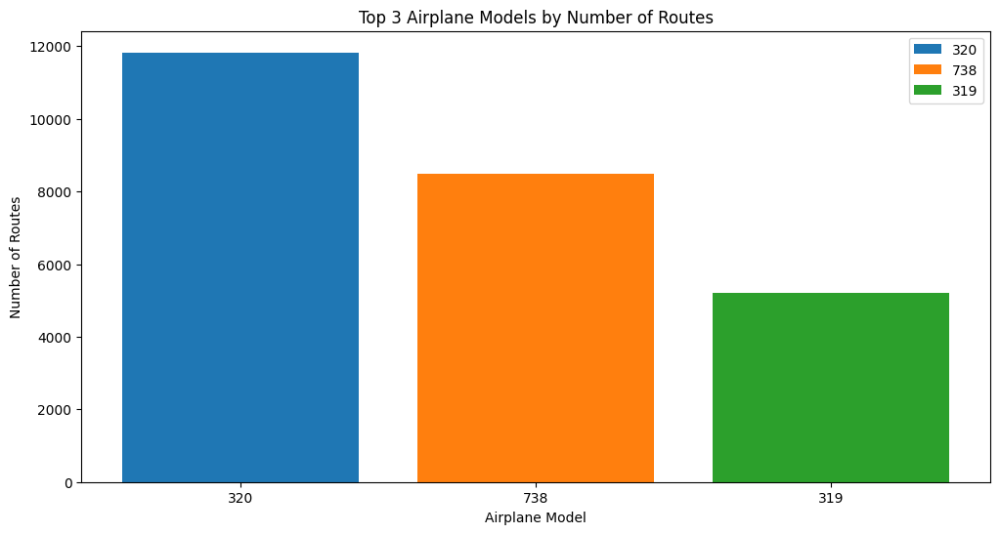

<ipython-input-1-e466b64787b4>:83: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, frequency in top_models.iteritems():


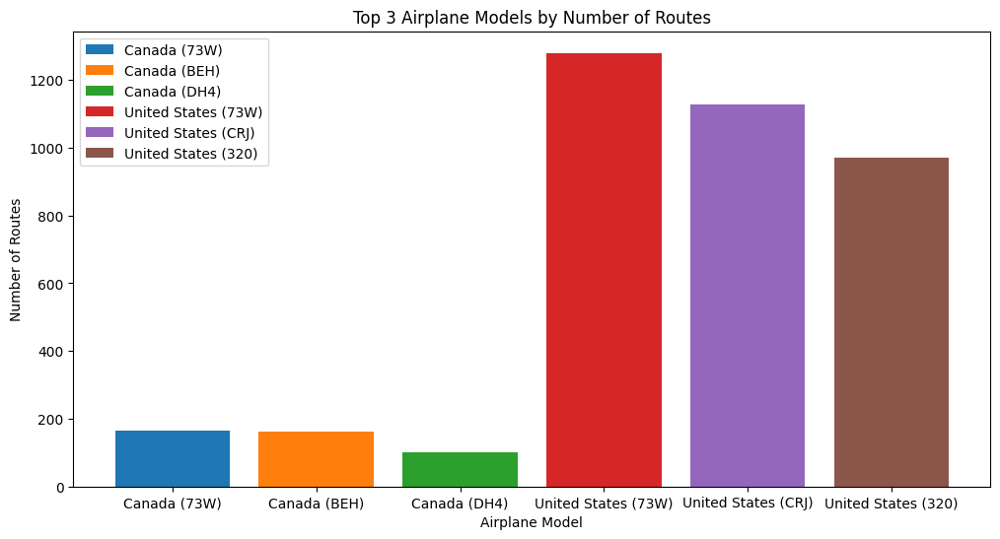

In [1]:
class FlightDataProcessor:
    def __init__(self, zip_url):
        """
        Downloads, extracts, and processes flight data from the given zip URL.

        Parameters:
        - zip_url (str): The URL of the flight data zip file.
        """
        # Set the destination folder for the extracted data in the main directory
        destination_folder = 'group_03/downloads'

        # Ensure the destination folder exists
        os.makedirs(destination_folder, exist_ok=True)

        # Define the path to the downloaded zip file
        zip_file_path = os.path.join(destination_folder, 'flight_data.zip')

        # Check if the zip file already exists
        if not os.path.exists(zip_file_path):
            # Download the zip file from the given URL
            response = requests.get(zip_url)

            # Save the zip file in the destination folder
            with open(zip_file_path, 'wb') as zip_file:
                zip_file.write(response.content)

            print("File downloaded successfully.")
        else:
            print("File already exists.")

        # Process the downloaded zip file
        zip_file = ZipFile(zip_file_path)
        zip_file.extractall(destination_folder)

        # Read the datasets into pandas dataframes
        self.airlines_df = pd.read_csv(os.path.join(destination_folder, 'airlines.csv'))
        self.airplanes_df = pd.read_csv(os.path.join(destination_folder, 'airplanes.csv'))
        self.airports_df = pd.read_csv(os.path.join(destination_folder, 'airports.csv'))
        self.routes_df = pd.read_csv(os.path.join(destination_folder, 'routes.csv'))

    def plot_top_airplane_models(self, countries=None, top_n=3):
        """
        Plot the N most used airplane models by number of routes for the specified countries.

        Parameters:
        - countries (str or list, optional): Name of the country or a list of countries. Default is None.
        - top_n (int, optional): Number of top airplane models to plot. Default is 3.
        """
        # Extract the 'Model' column from 'routes_df'
        self.routes_df['Model'] = self.routes_df['Equipment'].str.split().str[0]

        # Left join with 'airplanes_df' on 'Model' and 'IATA code'
        merged_df = pd.merge(self.routes_df, self.airplanes_df, left_on='Model', right_on='IATA code', how='left')

        # Left join with 'airports_df' on 'Source airport' and 'IATA'
        merged_df = pd.merge(merged_df, self.airports_df, left_on='Source airport', right_on='IATA', how='left')

        # Filter based on the specified countries
        if countries is None:
            filtered_df = merged_df
        else:
            filtered_df = merged_df[merged_df['Country'].isin(countries)]

        # Count frequencies of each model per country
        model_counts = filtered_df.groupby(['Country', 'Model']).size().reset_index(name='Frequency')

        # Get the top N models for each country or overall
        if countries is None:
            top_models = model_counts.groupby('Model')['Frequency'].sum().nlargest(top_n)
        else:
            top_models = model_counts.groupby(['Country', 'Model'])['Frequency'].sum().groupby('Country', group_keys=False).nlargest(top_n)

        # Plot the results
        plt.figure(figsize=(12, 6))
        for index, frequency in top_models.iteritems():
            model, country = index if isinstance(index, tuple) else (index, None)
            country_label = f" ({country})" if country is not None else ''
            plt.bar(f"{model}{country_label}", frequency, label=f"{model}{country_label}")

        plt.title(f'Top {top_n} Airplane Models by Number of Routes')
        plt.xlabel('Airplane Model')
        plt.ylabel('Number of Routes')
        plt.legend()
        plt.show()


# Example usage:
zip_url = 'https://gitlab.com/adpro9641208/group_03/-/raw/main/flight_data.zip'
flight_processor = FlightDataProcessor(zip_url)

# Plot top airplane models for all datasets
flight_processor.plot_top_airplane_models()

# Plot top airplane models for specific country/countries
flight_processor.plot_top_airplane_models(countries=['United States', 'Canada'])
